In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
rc('figure',figsize=(10,10))

## Собственно, создаем данные 2D:

In [3]:
N=1000
sx,sy = normal(2, size=(N,)), normal(5, size=(N,))
S = array([sx, sy])             # unmixed data
A = array([[-2, 3.5], [1, 5]])  # mixing matrix
M = A@S                   # mixed data
M = M - M.mean(axis=1).reshape(-1,1)
X = M.T

print( X.shape)

(1000, 2)


(-14.1532855751834, 19.117476298053763, -17.184523189979114, 16.08623868325805)

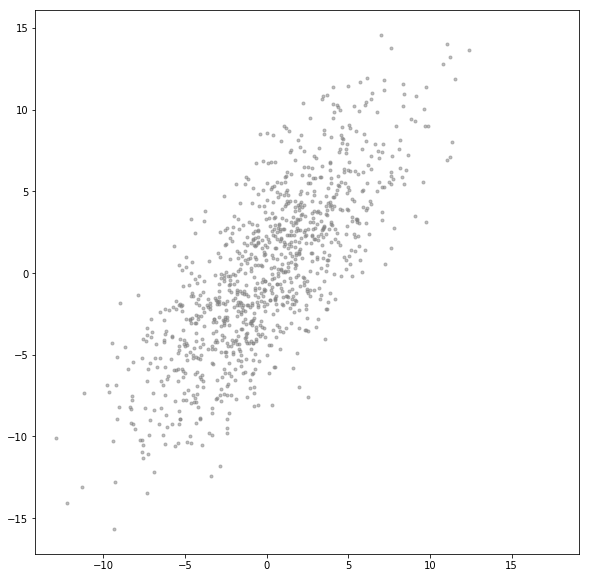

In [4]:
scatter(M[0],M[1],marker='.', alpha=0.5, color='gray')
axis('square')

## Eigendecomposition of covariance matrix (PCA)

In [5]:
cov(X.T)

array([[16.73311848, 16.11673053],
       [16.11673053, 26.15543633]])

In [6]:
var(X,axis=0)

array([16.71638536, 26.1292809 ])

In [7]:
X.T.dot(X)/(N-1)

array([[16.73311848, 16.11673053],
       [16.11673053, 26.15543633]])

In [8]:
eig?

 - `eigh` returns eigen values in ascending order, and we need descending
 - `eigh` returns normalized eigenvectors as *columns* 

In [9]:
eigen_values, eigen_vectors = eig(cov(X.T))
eigen_values = eigen_values[::-1]           
eigen_vectors = eigen_vectors[:,::-1]
print('eigen values:', eigen_values)
print('\n')
print('eigen vectors:')
eigen_vectors

eigen values: [38.23546621  4.65308861]


eigen vectors:


array([[-0.59976109, -0.80017913],
       [-0.80017913,  0.59976109]])

Eigenvalues are variances of projections on each eigenvector. Square roots of eigenvalues are standard deviations.

In [10]:
projections = X@eigen_vectors
print (projections.std(0))
print( eigen_values**0.5)

[6.18039082 2.15602308]
[6.18348334 2.1571019 ]


## PCA via SVD

\begin{equation}
X = USV^T
\end{equation}

`svd` returns eigenvectors of cov(X.T) as *rows* of `vh`. At least, it promises to:

 > The rows of `v` are the eigenvectors of ``a.H a``.

In [11]:
u,s,vh = svd(X, full_matrices=0)

print('u shape: ', u.shape)
print('vh shape: ', vh.shape)



u shape:  (1000, 2)
vh shape:  (2, 2)


In [12]:
s

array([195.44111836,  68.17943617])

In [13]:
projections2 = X.dot(vh.T)

print (s/(N-1)**0.5)
print (eigen_values**0.5)
print ("")
print (projections.std(0))
print (projections2.std(0))

[6.18348334 2.1571019 ]
[6.18348334 2.1571019 ]

[6.18039082 2.15602308]
[6.18039082 2.15602308]


Note, `s` is equal to standard deviations along projections if divided by $\sqrt{(N-1)}$.

Matrix `U` can be regarded as the "mixing" matrix or coefficient loadings. If $X=USV^T$, then $XV = US$

In [14]:
eigen_vectors

array([[-0.59976109, -0.80017913],
       [-0.80017913,  0.59976109]])

In [15]:
vh

array([[-0.59976109, -0.80017913],
       [-0.80017913,  0.59976109]])


## Vizualization

 1. Plot the cloud of points
 2. Plot principal axes as lines
 3. Plot principal vectors scaled by standard deviation of projections onto each axis

(-14.1532855751834,
 13.632105288377419,
 -17.184523189979114,
 16.086238683258053)

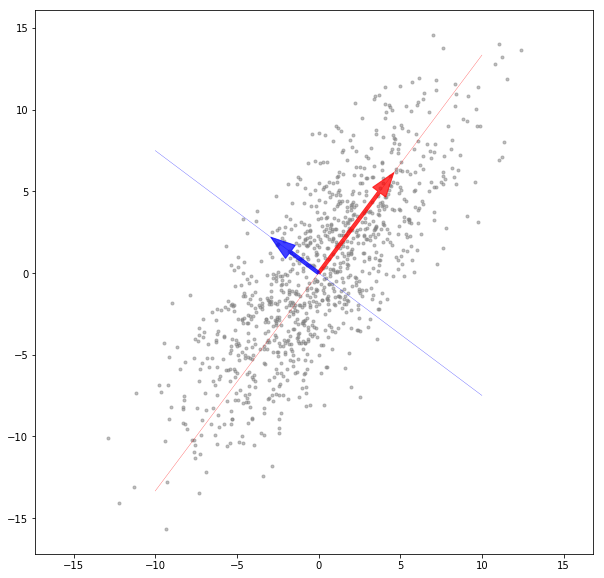

In [16]:
scatter(M[0],M[1],marker='.', alpha=0.5, color='gray')
sigmas = s/sqrt(N-1)


xfit = linspace(-10,10,100)

k1 = vh[0,1]/vh[0,0]
k2 = vh[1,1]/vh[1,0]

arrow(0,0, -sigmas[0]*vh[0,0], -sigmas[0]*vh[0,1], color='red', width=0.2,head_width=1.,alpha=0.75)
arrow(0,0, sigmas[1]*vh[1,0], sigmas[1]*vh[1,1], color='blue', width=0.2,head_width=1., alpha=0.75)

plot(xfit, xfit*k1, 'r-',lw=0.25)
plot(xfit, xfit*k2, 'b-', lw=0.25)
axis('equal')

# Данные в виде серии изображений

In [17]:
ls media

hexbug1.mp4  reena-data-best.h5  two-windmills.h5  V_ch7_1.tif


In [18]:
from imfun import fseq, ui

Can't load imreg package, affine and homography registrations won't work


(670, 240, 320)


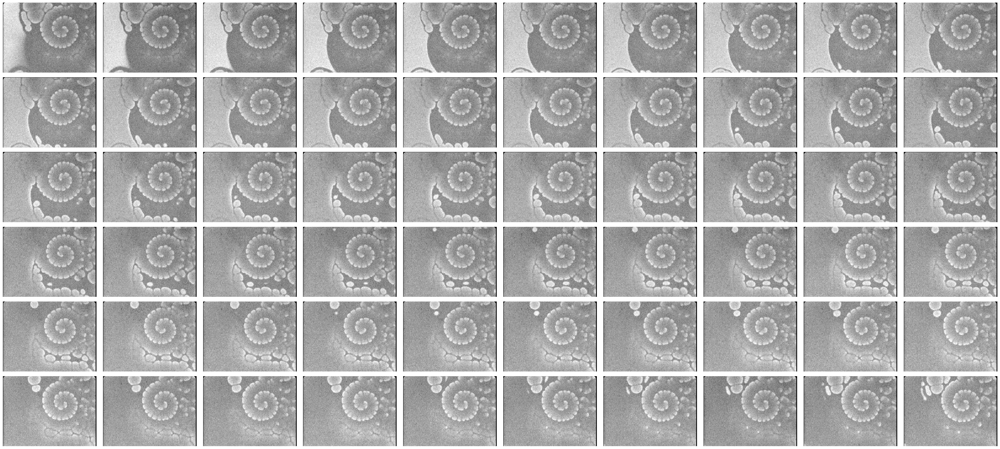

In [19]:
frames = fseq.from_tiff("media/V_ch7_1.tif")
data = frames.as3darray()
print (data.shape)
ui.group_maps(data[:300:5],10, imkw=dict(cmap='gray'), colorbar=False, figscale=4)
tight_layout();

 На рис. показана развертка первых 300 кадров (показан каждый 5-й). Данные представляют собой эволюцию спиральной волны. Всего в записи 670 кадров.

In [20]:
xc = data[:,20:180,110:280]
xcn = array([a - a.mean() for a in (xc - xc.mean(axis=0))])
sh = xc.shape[1:]
print( sh)

(160, 170)


In [21]:
xcn.std()

23.13591004108793

In [26]:
%matplotlib tk

In [24]:
X = xcn + randn(*xcn.shape)*50

In [27]:
ui.Picker(fseq.from_array(X)).start()

(<matplotlib.axes._subplots.AxesSubplot at 0x7fa4319622b0>,
 <imfun.ui.Picker_.Picker at 0x7fa43a5e39e8>)

In [36]:
%matplotlib inline

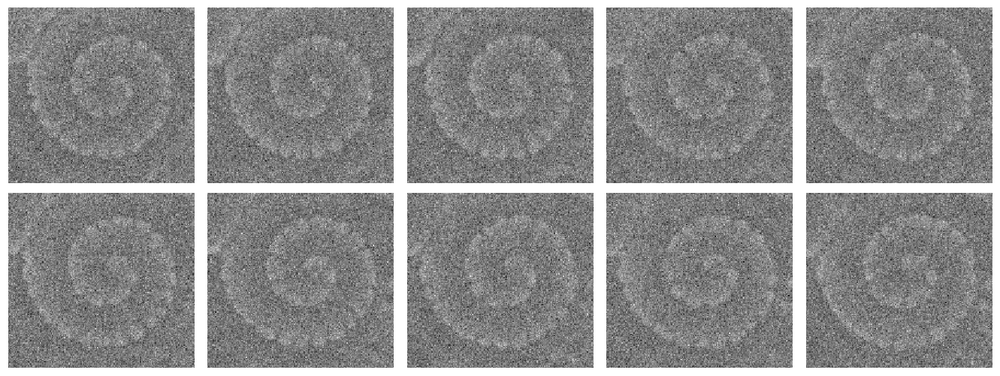

In [37]:
ui.group_maps(X[:50:5],5, imkw=dict(cmap='gray'), colorbar=False,figscale=3.5)
tight_layout(); 

In [28]:

sh[0]*sh[1]

27200

In [29]:
U, S, Vh = svd(X.reshape(670,prod(sh)), full_matrices=False);
print('U shape:', U.shape)
print('Vh shape:', Vh.shape)

U shape: (670, 670)
Vh shape: (670, 27200)


In [30]:
ui.group_maps(Vh[:25].reshape(-1,*sh),5,colorbar=False,figscale=5)
tight_layout()

In [31]:
plot(U[:,0])
plot(U[:,1])
plot(U[:,3])

In [32]:
fh, axs = subplots(4,5,sharex=True,sharey=True, figsize=(14,9))
for j,ax in enumerate(axs.ravel()):
    ax.plot(U[:,j], 'k-')
    ax.set_title(j+1)
setp(axs[-1,-1], xticks = [0,300,600])

In [33]:
plot(S, 's-')

In [34]:
figure(figsize=(12,6))
subplot(121)
plot(range(1,31),(S[:30]**2)/sum(S**2), 'ko')
title(u"Доля объясненной дисперсии")
xlabel(u"Номер компоненты")
ylabel("")

subplot(122)
title(u"Кумулятивная доля объясненной дисперсии")
plot(range(1,31),cumsum(S[:30]**2)/sum(S**2), 'ks')
xlabel(u"Номер компоненты")

Text(0.5, 0, 'Номер компоненты')

## Optimal singular value threshold

See [Gavish, Donoho 2014] and http://www.pyrunner.com/weblog/2016/08/01/optimal-svht/

In [37]:
def omega_approx(beta):
    return 0.56*beta**3 - 0.95*beta**2 + 1.82*beta + 1.43

def svht(sv, sh):
    m,n = sh
    if m>n: 
        m,n=n,m
    omg = omega_approx(m/n)
    return omg*median(sv)

def estimate_rank_gd(sv,sh):
    th = svht(sv,sh)
    return np.sum(sv>th)

In [38]:
r= estimate_rank_gd(S,Vh.shape)
r

15

Т.е. первых 15 компонент достаточно для описания динамики

In [39]:
close()
figure(figsize=(14,6))
plot(range(1,len(S)+1), cumsum(S**2)/sum(S**2), 'k-', lw=2)
title(u"Кумулятивная доля объясненной дисперии")
axvline(25, color='r')
axvline(r, color='m',ls='--')

text(27,0.9, "n=25", color='r')
text(r+3,0.95, "n=%d"%r, color='m')

xlabel(u"Номер компоненты")

Text(0.5, 0, 'Номер компоненты')

### Приближенная реконструкция:

In [40]:
Xapprox = (U[:,:r]@diag(S[:r])@Vh[:r]).reshape(xcn.shape)

In [41]:
ui.group_maps(xcn[:25:5],5, imkw=dict(cmap='gray'), colorbar=False,figscale=3.5)
tight_layout(); 

In [42]:
ui.group_maps(Xapprox[:25:5],5, imkw=dict(cmap='gray'), colorbar=False,figscale=3.5)
tight_layout(); 

In [43]:
%matplotlib tk

In [44]:
p = ui.Picker(fseq.from_array(X));
p.start()
p.clims = [(-50,100)]

In [45]:
p = ui.Picker(fseq.from_array(Xapprox));
p.start()
p.clims = [(-50,100)]

### Реконструкция с фильтрацией временных мод

In [46]:
%matplotlib inline

In [47]:
rc('figure', figsize=(14,10))

In [48]:
from imfun.filt import l2spline

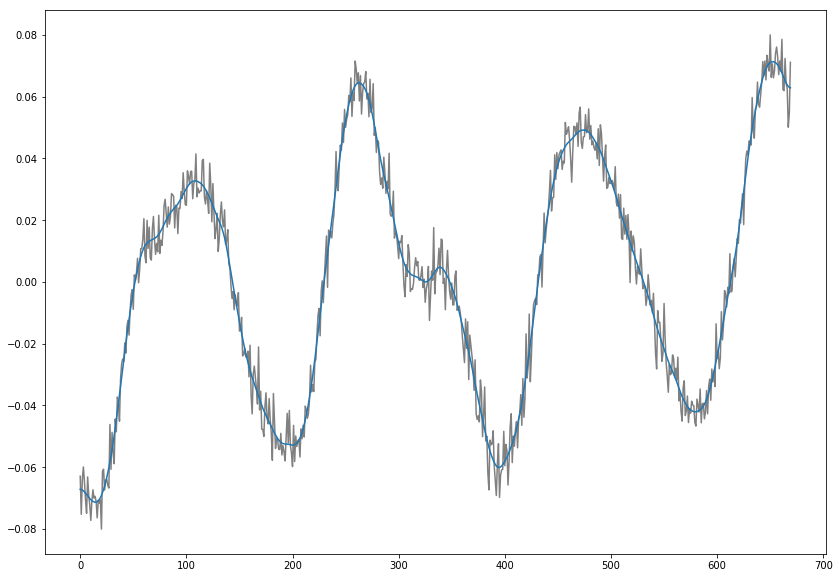

In [49]:
plot(U[:,10],'gray')
plot(l2spline(U[:,10],5))

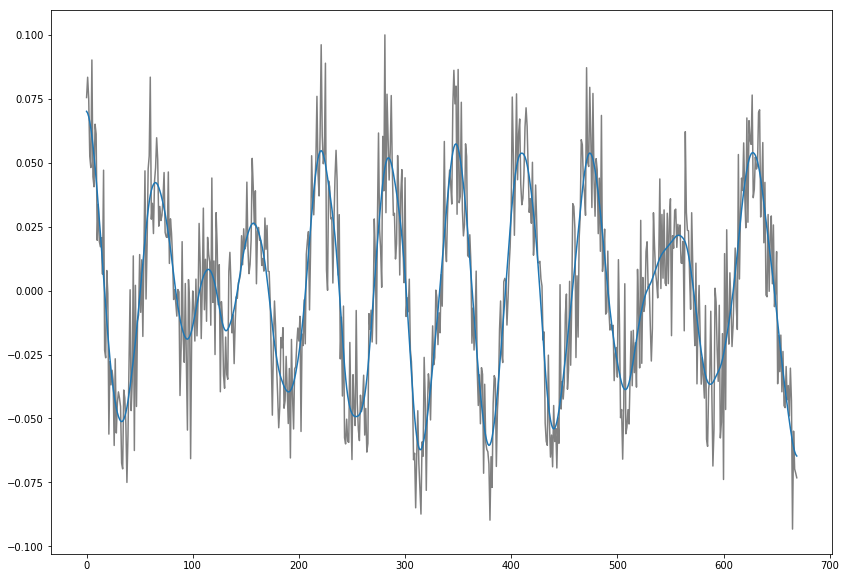

In [50]:
plot(U[:,20],'gray')
plot(l2spline(U[:,20],5))

In [51]:
Usmoothed = array([l2spline(uv,5) for uv in U.T[:r]]).T

In [52]:
Xapprox2 = (Usmoothed@diag(S[:r])@Vh[:r]).reshape(xcn.shape)

In [53]:
%matplotlib tk

In [54]:
p = ui.Picker(fseq.FStackColl([fseq.from_array(X),
                               fseq.from_array(Xapprox),
                               fseq.from_array(Xapprox2),
                               fseq.from_array(Xapprox-Xapprox2)]));
p.start()
p.clims = [(-50,100)]*4

# exact DMD (Fortran/Matlab data order)

if $X$ is a matrix of inputs or states at times $t=n\Delta t$, and $Y$ is a matrix of outputs or states at times $t+\Delta t$, with each data set (e.g. video frame) raveled as a column vector, then

Low-rank $r$ truncated SVD approximation
\begin{equation}
X = U\Sigma V^*\,,
\end{equation}

\begin{equation}
Y = AX
\end{equation}

\begin{equation}
A = YX^\dagger = YV\Sigma^{-1}U^*
\end{equation}

\begin{equation}
\tilde{A} = U^*AU = U^*YV\Sigma^{-1}
\end{equation}

\begin{equation}
\tilde{A}W = W\lambda
\end{equation}


\begin{equation}
\Phi = YV\Sigma^{-1}W
\end{equation}

In [55]:
def dmdf(X,Y=None, r=None,sort_explained=True,smooth_coefs=False,smooth_sigma=5):
    if Y is None:
        Y = X[:,1:]
        X = X[:,:-1]
    U,sv,Vh = svd(X,False)
    if r is None:
        tr = svht(sv,X.shape)
        r = np.sum(sv>tr)
        #if not r%2:
        #    r += 1
    if smooth_coefs:
        Vh = array([l2spline(v,smooth_sigma) for v in Vh[:r]])
    sv = sv[:r]
    V = Vh[:r].conj().T
    Uh = U[:,:r].conj().T
    B = Y@V@(diag(1/sv))
    Atilde = Uh@B
    lam, W = eig(Atilde)
    Phi = B@W
    #print(Vh.shape)
    # approx to b
    def _bPOD(i):
        alpha1 =diag(sv[:r])@Vh[:r,i]
        return lstsq(Atilde@W,alpha1,rcond=None)[0]
    bPOD = _bPOD(0)
    stats = (None,None)
    if sort_explained:
        proj_dmd = array([_bPOD(i) for i in range(Vh.shape[1])])
        dmd_std = proj_dmd.std(0)
        dmd_mean = abs(proj_dmd).mean(0)
        stats = (dmd_mean,dmd_std)
        kind = argsort(dmd_std)[::-1]
    else:
        kind = arange(r)[::-1] # from slow to fast
    Phi = Phi[:,kind]
    lam = lam[kind]
    bPOD=bPOD[kind]
    
    return lam, Phi,bPOD,stats

def plot_eigenvals(lam,cont_time=True,ax=None):
    if ax is None:
        f,ax = subplots(1,1)
    if cont_time:
        omega = log(lam)/2/pi
    else:
        omega = lam
    ax.plot(omega.real, omega.imag, 'o')
    omeg_str = r'\omega' if cont_time else r'\lambda'
    ax.set_xlabel('$\\Re(%s)$'%omeg_str)
    ax.set_ylabel('$\\Im(%s)$'%omeg_str)
    ax.grid(True)
    if not cont_time:
        c = Circle((0,0),radius=1.,ls='--',edgecolor='k',facecolor='none')
        ax.add_patch(c)
        ax.axis('square')
        ax.set_title('Discrete-time eigenvalues')
    else:
        ax.set_title('Continuous-time eigenvalues')
    #gcf()

In [58]:
Xdmd = X.reshape(-1,prod(sh)).T

In [60]:
lam, Phi,bx,_ = dmdf(Xdmd, r=r*2,smooth_coefs=True)

In [62]:
Phi.shape

(27200, 30)

In [63]:
Phi_img = Phi.T.reshape(-1,*sh)

In [64]:
%matplotlib inline

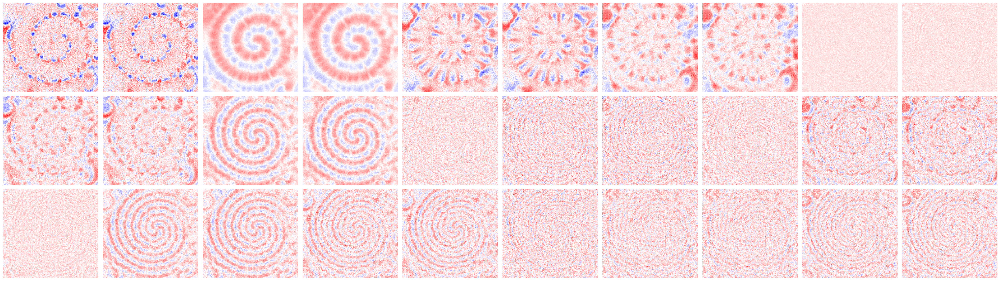

In [65]:
ui.group_maps(Phi_img.real,colorbar=False, figscale=5,imkw=dict(cmap='bwr'))
tight_layout()

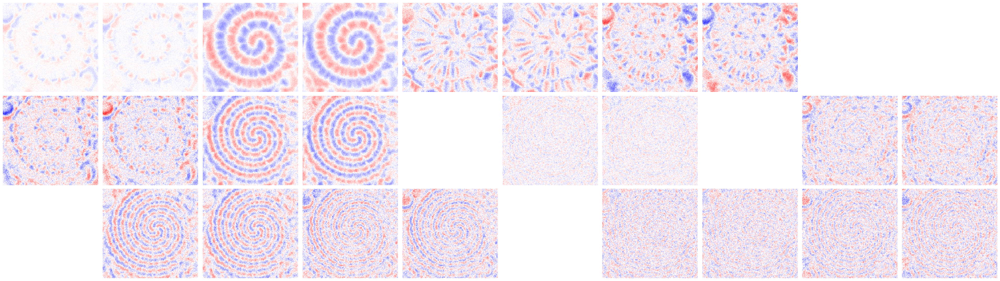

In [66]:
ui.group_maps(Phi_img.imag,colorbar=False, figscale=5,imkw=dict(cmap='bwr'))
tight_layout()

(-0.25, 0.25)

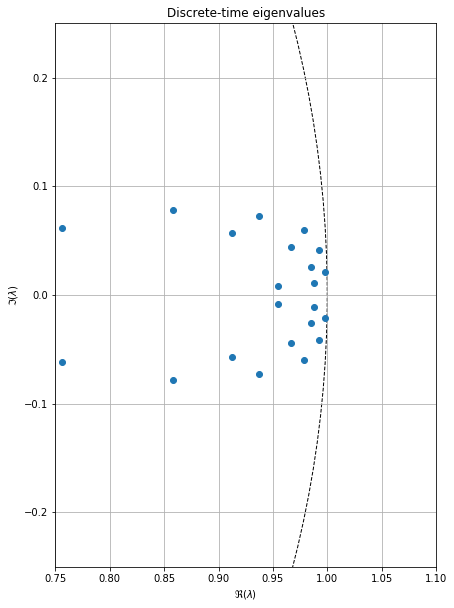

In [67]:
figure(figsize=(10,10))
plot_eigenvals(lam,False,gca())
xlim(0.75,1.1); ylim(-0.25,0.25)

### Reconstcrution of dynamics

\begin{equation}
X_0 = \Phi\mathbf{z}
\end{equation}

\begin{equation}
X_k = \Phi\Lambda^k\mathbf{z}\,,\;\text{for}\; k=0,\dots
\end{equation}

In [74]:
%time zfirst = lstsq(Phi, Xdmd[:,0],rcond=None)[0]
%time zlast = lstsq(Phi, Xdmd[:,-1],rcond=None)[0]

CPU times: user 72.5 ms, sys: 0 ns, total: 72.5 ms
Wall time: 18.3 ms
CPU times: user 67.7 ms, sys: 4.2 ms, total: 71.9 ms
Wall time: 18 ms


In [75]:
zlast.shape

(30,)

In [76]:
Xrec = Phi@diag(zfirst)@vander(lam,len(X),True)
Xrec = Xrec.T.real.reshape(X.shape)

In [77]:
Xrec2 = Phi@diag(zlast)@vander(lam,300,True)
Xrec2 = Xrec2.T.real.reshape(300,*sh)

In [78]:
%matplotlib tk

In [79]:
p = ui.Picker(fseq.FStackColl([fseq.from_array(X),
                               fseq.from_array(Xapprox),
                               fseq.from_array(Xrec)]));
p.start()
p.clims = [(-20,100)]*10

In [80]:
p=ui.Picker(fseq.from_array(Xrec2));
p.start()
p.clims = [(-20,100)]*10

In [81]:
def one_step_predictions(X,lam,Phi):
    out = []
    for i in range(X.shape[1]-1):
        Y = X[:,i+1]
        b = lstsq(Phi, X[:,i],rcond=None)[0]
        Ypred = Phi@diag(lam)@b.reshape(-1,1)
        out.append(norm(Y-Ypred.ravel())/len(Y))
    return array(out)

In [82]:
v = one_step_predictions(Xdmd,lam,Phi)

In [83]:
plot(v)

In [ ]:
norm?

## Windmills

In [84]:
frames = fseq.from_hdf5('media/two-windmills.h5')

In [85]:
frames.frame_shape

(90, 160)

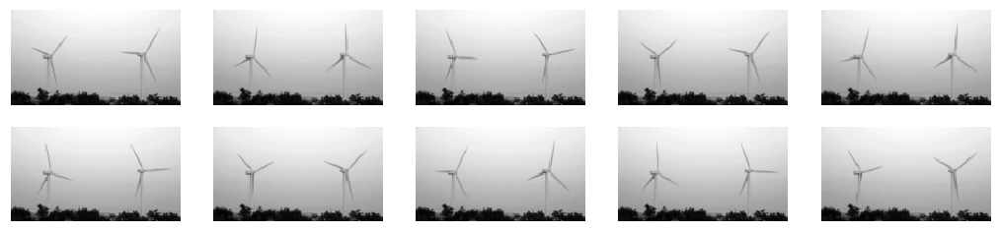

In [86]:
ui.group_maps(frames[:100:10],5,colorbar=False,imkw=dict(cmap='gray'))
gcf()

In [87]:
frame_crop = (slice(10,None),slice(0,80))

In [88]:
cropped_frames = array([f[frame_crop] for f in frames])

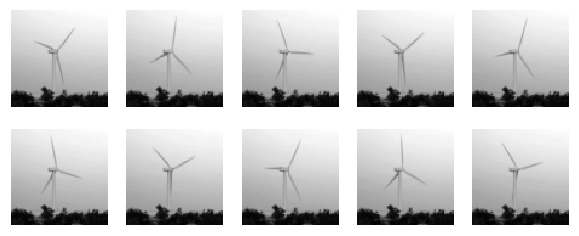

In [89]:
ui.group_maps(cropped_frames[:100:10],5,colorbar=False,imkw=dict(cmap='gray'))
gcf()

In [90]:
sh = cropped_frames[0].shape
sh

(80, 80)

In [91]:
Xdmd = cropped_frames.reshape(-1,prod(sh)).T

In [92]:
lam, Phi,bx,_ = dmdf(Xdmd, r=r*2,smooth_coefs=False)

In [93]:
%matplotlib inline

In [94]:
Phi_img = Phi.T.reshape(-1,*sh)

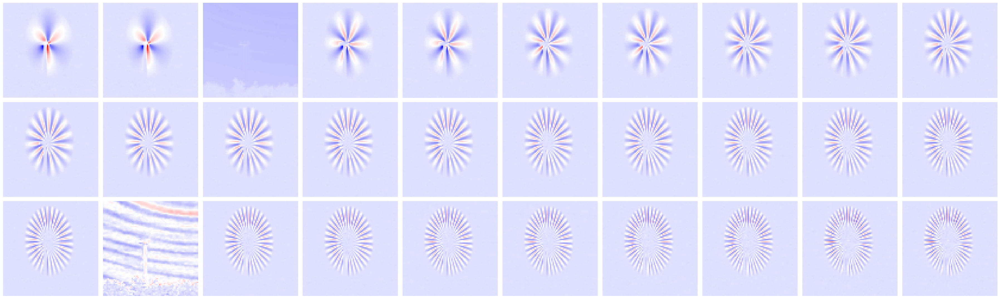

In [95]:
ui.group_maps(Phi_img.real,colorbar=False, figscale=5,imkw=dict(cmap='bwr'))
tight_layout()

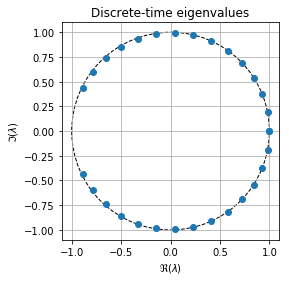

In [96]:
plot_eigenvals(lam,False)

In [99]:
%matplotlib tk

In [100]:
ui.Picker(fseq.from_array(cropped_frames)).start()

(<matplotlib.axes._subplots.AxesSubplot at 0x7fa44a69dcc0>,
 <imfun.ui.Picker_.Picker at 0x7fa44a153e80>)

1
area <itertools._grouper object at 0x7fa44a69ddd8>
signal shape: (1, 227)
50.61
1
area <itertools._grouper object at 0x7fa44a329780>
signal shape: (1, 227)
1
area <itertools._grouper object at 0x7fa468dcd320>
signal shape: (1, 227)
1
area <itertools._grouper object at 0x7fa44a3b93c8>
signal shape: (1, 227)


In [101]:
%time zfirst = lstsq(Phi, Xdmd[:,0],rcond=None)[0]

CPU times: user 9.23 ms, sys: 3.77 ms, total: 13 ms
Wall time: 3.46 ms


In [102]:
Xrec = Phi@diag(zfirst)@vander(lam,len(cropped_frames),True)
Xrec = Xrec.T.real.reshape(cropped_frames.shape)

In [ ]:
%matplotlib tk

In [103]:
p = ui.Picker(fseq.from_array(Xrec))
p.start()

(<matplotlib.axes._subplots.AxesSubplot at 0x7fa44a7169e8>,
 <imfun.ui.Picker_.Picker at 0x7fa44a449da0>)

1
area <itertools._grouper object at 0x7fa44a37d4a8>
signal shape: (1, 227)
1
area <itertools._grouper object at 0x7fa46623f160>
signal shape: (1, 227)


full frame

In [104]:
sh = frames.frame_shape

In [105]:
Xdmd = reshape(frames.data, (-1,prod(sh))).T

In [106]:
lam, Phi,bx,_ = dmdf(Xdmd, r=r*2,smooth_coefs=False)

In [107]:
%matplotlib inline

In [108]:
Phi_img = Phi.T.reshape(-1,*sh)

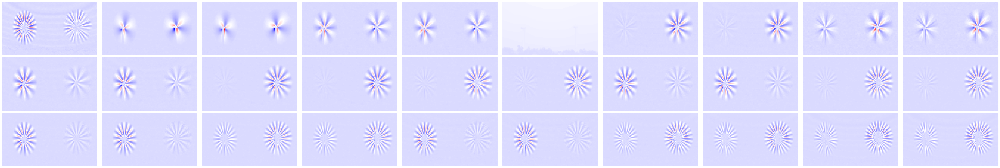

In [109]:
ui.group_maps(Phi_img.real,colorbar=False, figscale=5,imkw=dict(cmap='bwr'))
tight_layout()

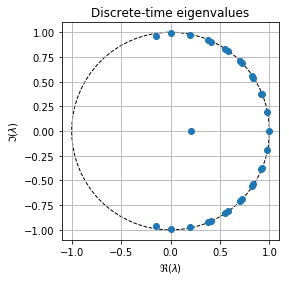

In [111]:
plot_eigenvals(lam,False)

In [112]:
%time zfirst = lstsq(Phi, Xdmd[:,0],rcond=None)[0]

CPU times: user 24.2 ms, sys: 0 ns, total: 24.2 ms
Wall time: 5.8 ms


In [113]:
Xrec = Phi@diag(zfirst)@vander(lam,len(frames),True)
Xrec = Xrec.T.real.reshape(frames.data.shape)

In [114]:
%matplotlib tk

In [115]:
p = ui.Picker(fseq.FStackColl([frames,fseq.from_array(Xrec)]))
p.start()

(<matplotlib.axes._subplots.AxesSubplot at 0x7fa4642d4978>,
 <imfun.ui.Picker_.Picker at 0x7fa4643109b0>)

1
area <itertools._grouper object at 0x7fa4642019b0>
signal shape: (2, 227)
1
area <itertools._grouper object at 0x7fa46408a198>
signal shape: (2, 227)
1
area <itertools._grouper object at 0x7fa49f2bd160>
signal shape: (2, 227)
